###  Objective: 
1. Perform EDA
2. Fit Linear ,Lasso and Rigde Regression 

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as  np
import pandas as  pd
import os
pd.options.display.max_columns=40
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn import preprocessing
from sklearn import linear_model
from yellowbrick.regressor import ResidualsPlot
sns.set(style='whitegrid', context='notebook')
#### I used https://www.scikit-yb.org/en/latest/api/regressor/residuals.html to get my Residuals Plots

In [2]:
## load the data
path_hw4="C:\\Users\\fbaharkoush\\IE 598 Machine Learning\\Homework\HW 4\\"
df_boston=pd.read_csv(path_hw4+"housing.csv")

In [3]:
df_boston.isnull().sum().reset_index(name="Count_Null").sort_values("Count_Null",ascending=False).head()

,index,Count_Null
26,MEDV,54
14,ZN,0
25,LSTAT,0
24,B,0
23,PTRATIO,0


In [4]:
df_boston.describe()

,ATT1,ATT2,ATT3,ATT4,ATT5,ATT6,ATT7,ATT8,ATT9,ATT10,ATT11,ATT12,ATT13,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,452.000000
mean,0.518457,0.500422,0.507451,0.498543,0.525487,0.508831,0.501997,0.509998,0.480159,0.501922,0.502028,0.513974,0.501438,1.269195,13.295257,9.205158,0.140765,1.101175,15.679800,58.744660,6.173308,78.063241,339.317787,42.614980,332.791107,11.537806,23.750442
std,0.283847,0.298752,0.289607,0.294229,0.283387,0.282400,0.287986,0.290160,0.301086,0.294051,0.292141,0.285151,0.295556,2.399207,23.048697,7.169630,0.312765,1.646991,27.220206,33.104049,6.476435,203.542157,180.670077,87.585243,125.322456,6.064932,8.808602
min,0.000727,0.000321,0.000013,0.001541,0.003970,0.000679,0.003653,0.000525,0.001093,0.000263,0.001753,0.003349,0.000834,0.000000,0.000000,0.000000,0.000000,0.385000,3.561000,1.137000,1.129600,1.000000,20.200000,2.600000,0.320000,1.730000,6.300000
25%,0.272918,0.235879,0.244897,0.229861,0.283208,0.276366,0.271701,0.257320,0.208171,0.248119,0.247347,0.273949,0.249382,0.049442,0.000000,3.440000,0.000000,0.449000,5.961500,32.000000,2.430575,4.000000,254.000000,17.000000,364.995000,6.877500,18.500000
50%,0.521326,0.485701,0.526013,0.506543,0.514982,0.509443,0.499804,0.508327,0.465557,0.487129,0.519512,0.516537,0.507128,0.144655,0.000000,6.960000,0.000000,0.538000,6.322500,65.250000,3.925850,5.000000,307.000000,18.900000,390.660000,10.380000,21.950000
75%,0.770235,0.774921,0.750546,0.757517,0.772218,0.730899,0.756420,0.768465,0.739580,0.771559,0.748085,0.753155,0.765138,0.819622,18.100000,18.100000,0.000000,0.647000,6.949000,89.975000,6.332075,24.000000,403.000000,20.200000,395.615000,15.015000,26.600000
max,0.995798,0.999265,0.998746,0.995561,0.998635,0.998194,0.999140,0.997083,0.996714,0.999321,0.999448,0.996523,0.999183,9.966540,100.000000,27.740000,1.000000,7.313000,100.000000,100.000000,24.000000,666.000000,711.000000,396.900000,396.900000,34.410000,50.000000


In [5]:
### Drop Na
df_boston=df_boston[~df_boston["MEDV"].isnull()]

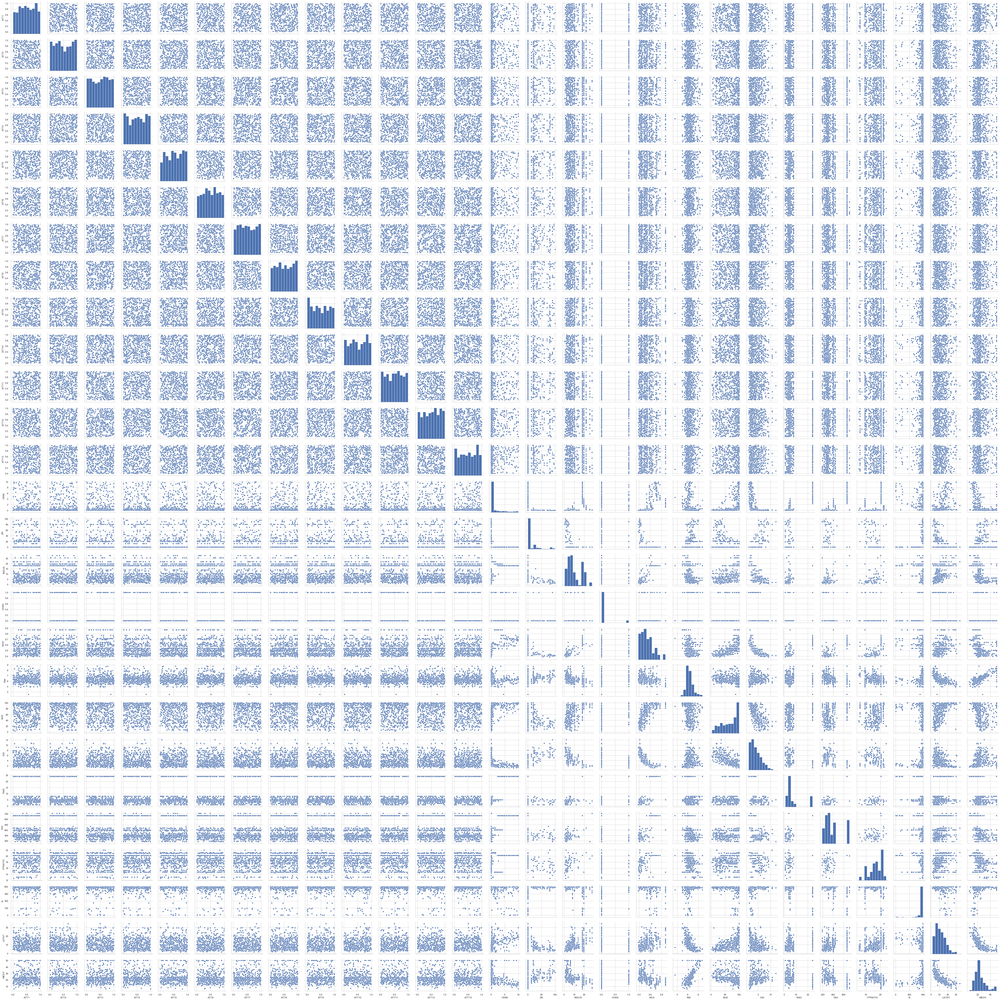

In [6]:
cols = ['CRIM', 'ZN', 'INDUS', 'CHAS',
       'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT',
       'MEDV']
cols=df_boston.columns
sns.pairplot(df_boston[cols], height=2.5);
plt.show()

In [7]:
### Correlatio Matrix of with noise and without noise
corelation_mat_main=np.corrcoef(df_boston[cols].values.T)
corelation_mat_all=np.corrcoef(df_boston.values.T)

### Correation of Main Features

In [8]:
df_boston[cols].corr().style.background_gradient(cmap='coolwarm')

,ATT1,ATT2,ATT3,ATT4,ATT5,ATT6,ATT7,ATT8,ATT9,ATT10,ATT11,ATT12,ATT13,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
ATT1,1,-0.0393906,-0.0584703,0.00579667,-0.00131712,-0.0553738,-0.0041165,-0.0283839,0.0195857,-0.0706257,0.0169954,-0.0954142,-0.0227763,0.003836,-0.00811459,0.00697409,-0.0448159,0.0316173,-0.0175387,0.0147628,-0.000928052,0.0215437,0.0266642,0.0255884,-0.000814502,-0.0139565,0.0352779
ATT2,-0.0393906,1,0.0614805,0.0820339,-0.0124699,-0.049294,-0.0563567,-0.0839566,-0.0708838,-0.0473582,-0.0185832,-7.34479e-05,0.0406193,-0.0449671,-0.020937,-0.0192629,0.0145824,0.00692395,-0.0750037,-0.0184118,0.017527,-0.0648445,-0.0578528,0.0300265,-0.00562704,-0.0258806,-0.0552499
ATT3,-0.0584703,0.0614805,1,-0.028767,-0.105727,-0.00506341,0.0630101,-0.00459626,0.0132238,-0.0309737,-0.130766,0.0904192,-0.0325285,-0.0751217,0.0585966,-0.0739152,0.0616578,-0.0447727,0.0178259,-0.0976561,0.0485052,-0.0889498,-0.0772828,-0.100348,0.0598404,-0.0702257,0.0862196
ATT4,0.00579667,0.0820339,-0.028767,1,0.0388386,-0.0505839,-0.053885,-0.0028577,-0.0641444,0.0234457,-0.0540493,0.0654326,-0.0139212,0.0176283,0.0137604,-0.00533534,-0.0542602,-0.0372624,-0.0980681,-0.0612558,0.0432775,-0.0256822,0.000672745,0.0135786,0.0499316,0.0246583,-0.0587008
ATT5,-0.00131712,-0.0124699,-0.105727,0.0388386,1,-0.0364982,0.0140348,0.0214297,0.00937151,-0.0106896,-0.00808259,-0.069182,-0.0114011,0.0303614,0.0644341,0.0581948,-0.0121985,0.0341932,-0.00610959,-0.0769373,0.0299215,0.00887383,0.0473715,-0.0239168,-0.0216864,-0.0277157,-0.0370432
ATT6,-0.0553738,-0.049294,-0.00506341,-0.0505839,-0.0364982,1,-0.0013691,-0.0193839,-0.0237537,-0.0258475,0.00958635,-0.0440384,-0.00999529,-0.0277578,0.00256289,-0.0584812,-0.0526318,-0.00835576,-0.0276055,-0.000204761,-0.0282616,-0.0410754,-0.0895838,0.00936369,-0.043346,0.00339687,-0.0357827
ATT7,-0.0041165,-0.0563567,0.0630101,-0.053885,0.0140348,-0.0013691,1,-0.0530118,0.0194699,0.0058869,0.00341212,-0.0768878,-0.0224318,-0.015432,0.0318751,0.0309388,0.00798708,-0.006564,0.0383126,-0.0925299,0.0330594,0.0467021,0.0367761,-0.00351435,0.00588626,-0.0293434,0.0446028
ATT8,-0.0283839,-0.0839566,-0.00459626,-0.0028577,0.0214297,-0.0193839,-0.0530118,1,0.00405541,-0.00395001,0.0862667,0.108042,0.00563103,0.0272185,0.063499,0.0226015,0.0468802,-0.00945539,0.0385365,0.00916505,0.0242404,0.0134176,0.032574,-0.0119899,0.035065,0.00569125,0.00116777
ATT9,0.0195857,-0.0708838,0.0132238,-0.0641444,0.00937151,-0.0237537,0.0194699,0.00405541,1,0.00933168,-0.0414891,0.037773,0.0262181,-0.0777255,0.00306033,0.0118954,0.0265084,-0.0291337,0.0114378,-0.0581497,0.0407477,-0.0949988,-0.071941,-0.0853115,0.0198068,-0.0138942,0.0166767
ATT10,-0.0706257,-0.0473582,-0.0309737,0.0234457,-0.0106896,-0.0258475,0.0058869,-0.00395001,0.00933168,1,0.0246643,0.0830965,0.0352855,0.0680608,-0.131538,0.0938569,-0.0249248,0.0603809,-0.018232,0.0924141,-0.0998183,0.0646683,0.061901,0.0477149,-0.051664,0.113991,-0.0812144


In [9]:
### Corecaltion of all with noise
df_boston.corr().style.background_gradient(cmap='coolwarm')

,ATT1,ATT2,ATT3,ATT4,ATT5,ATT6,ATT7,ATT8,ATT9,ATT10,ATT11,ATT12,ATT13,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
ATT1,1,-0.0393906,-0.0584703,0.00579667,-0.00131712,-0.0553738,-0.0041165,-0.0283839,0.0195857,-0.0706257,0.0169954,-0.0954142,-0.0227763,0.003836,-0.00811459,0.00697409,-0.0448159,0.0316173,-0.0175387,0.0147628,-0.000928052,0.0215437,0.0266642,0.0255884,-0.000814502,-0.0139565,0.0352779
ATT2,-0.0393906,1,0.0614805,0.0820339,-0.0124699,-0.049294,-0.0563567,-0.0839566,-0.0708838,-0.0473582,-0.0185832,-7.34479e-05,0.0406193,-0.0449671,-0.020937,-0.0192629,0.0145824,0.00692395,-0.0750037,-0.0184118,0.017527,-0.0648445,-0.0578528,0.0300265,-0.00562704,-0.0258806,-0.0552499
ATT3,-0.0584703,0.0614805,1,-0.028767,-0.105727,-0.00506341,0.0630101,-0.00459626,0.0132238,-0.0309737,-0.130766,0.0904192,-0.0325285,-0.0751217,0.0585966,-0.0739152,0.0616578,-0.0447727,0.0178259,-0.0976561,0.0485052,-0.0889498,-0.0772828,-0.100348,0.0598404,-0.0702257,0.0862196
ATT4,0.00579667,0.0820339,-0.028767,1,0.0388386,-0.0505839,-0.053885,-0.0028577,-0.0641444,0.0234457,-0.0540493,0.0654326,-0.0139212,0.0176283,0.0137604,-0.00533534,-0.0542602,-0.0372624,-0.0980681,-0.0612558,0.0432775,-0.0256822,0.000672745,0.0135786,0.0499316,0.0246583,-0.0587008
ATT5,-0.00131712,-0.0124699,-0.105727,0.0388386,1,-0.0364982,0.0140348,0.0214297,0.00937151,-0.0106896,-0.00808259,-0.069182,-0.0114011,0.0303614,0.0644341,0.0581948,-0.0121985,0.0341932,-0.00610959,-0.0769373,0.0299215,0.00887383,0.0473715,-0.0239168,-0.0216864,-0.0277157,-0.0370432
ATT6,-0.0553738,-0.049294,-0.00506341,-0.0505839,-0.0364982,1,-0.0013691,-0.0193839,-0.0237537,-0.0258475,0.00958635,-0.0440384,-0.00999529,-0.0277578,0.00256289,-0.0584812,-0.0526318,-0.00835576,-0.0276055,-0.000204761,-0.0282616,-0.0410754,-0.0895838,0.00936369,-0.043346,0.00339687,-0.0357827
ATT7,-0.0041165,-0.0563567,0.0630101,-0.053885,0.0140348,-0.0013691,1,-0.0530118,0.0194699,0.0058869,0.00341212,-0.0768878,-0.0224318,-0.015432,0.0318751,0.0309388,0.00798708,-0.006564,0.0383126,-0.0925299,0.0330594,0.0467021,0.0367761,-0.00351435,0.00588626,-0.0293434,0.0446028
ATT8,-0.0283839,-0.0839566,-0.00459626,-0.0028577,0.0214297,-0.0193839,-0.0530118,1,0.00405541,-0.00395001,0.0862667,0.108042,0.00563103,0.0272185,0.063499,0.0226015,0.0468802,-0.00945539,0.0385365,0.00916505,0.0242404,0.0134176,0.032574,-0.0119899,0.035065,0.00569125,0.00116777
ATT9,0.0195857,-0.0708838,0.0132238,-0.0641444,0.00937151,-0.0237537,0.0194699,0.00405541,1,0.00933168,-0.0414891,0.037773,0.0262181,-0.0777255,0.00306033,0.0118954,0.0265084,-0.0291337,0.0114378,-0.0581497,0.0407477,-0.0949988,-0.071941,-0.0853115,0.0198068,-0.0138942,0.0166767
ATT10,-0.0706257,-0.0473582,-0.0309737,0.0234457,-0.0106896,-0.0258475,0.0058869,-0.00395001,0.00933168,1,0.0246643,0.0830965,0.0352855,0.0680608,-0.131538,0.0938569,-0.0249248,0.0603809,-0.018232,0.0924141,-0.0998183,0.0646683,0.061901,0.0477149,-0.051664,0.113991,-0.0812144


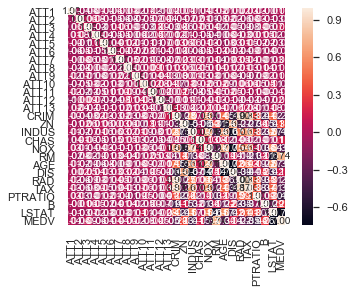

In [10]:
hm = sns.heatmap(corelation_mat_main,cbar=True,
                 annot=True,
                 square=True,
                 fmt='.2f',
                 annot_kws={'size': 10},
                 yticklabels=cols,
                 xticklabels=cols)

### Linear Regression Model
Model 1.1: Without using noise columns and using all features

In [11]:
### Select Features
X=df_boston[cols].drop("MEDV",axis=1).values
features=df_boston[cols].drop("MEDV",axis=1).columns
### select targer
y=df_boston["MEDV"].values

In [12]:
### Scale X
X=preprocessing.scale(X)
y=preprocessing.scale(y)

In [13]:
### SPllit the data
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [14]:
### chose model
linear_reg=linear_model.LinearRegression()
### fit the model
linear_reg.fit(X_train,y_train)
### predict
y_pred=linear_reg.predict(X_test)
y_pred_train=linear_reg.predict(X_train)

In [15]:
### R^2 of train and test
r_square=[metrics.explained_variance_score(y_train,y_pred_train),metrics.explained_variance_score(y_test,y_pred)]
### MAE
MAE=[metrics.mean_absolute_error(y_train,y_pred_train),metrics.mean_absolute_error(y_test,y_pred)]
### MSE
MSE=[metrics.mean_squared_error(y_train,y_pred_train),metrics.mean_squared_error(y_test,y_pred)]
## RMSE
RMSE=[np.sqrt(metrics.mean_squared_error(y_train,y_pred_train)),np.sqrt(metrics.mean_squared_error(y_test,y_pred))]

In [16]:
## Measure Accuracy Molde 1.1
df_lr_acc1=pd.DataFrame({
    "Index":["Train","Test"],
"R^2 Main Features":r_square,"MAE Main Features":MAE,"MSE Main Features":MSE,
"RMSE Main Features": RMSE})
df_lr_acc1

,Index,R^2 Main Features,MAE Main Features,MSE Main Features,RMSE Main Features
0,Train,0.759486,0.349257,0.246408,0.496395
1,Test,0.679171,0.350475,0.288309,0.536945


In [17]:
pd.DataFrame(linear_reg.coef_,features).T

,ATT1,ATT2,ATT3,ATT4,ATT5,ATT6,ATT7,ATT8,ATT9,ATT10,ATT11,ATT12,ATT13,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.072984,-0.010043,0.028621,-0.0004,-0.009597,-0.026766,-0.003809,-0.025626,-0.015178,-0.028279,-0.042908,0.037679,-0.005405,-0.057204,0.094186,0.03861,0.053762,-0.158017,0.410433,-0.074309,-0.335856,0.217899,-0.170501,-0.215033,0.105972,-0.320773


In [18]:
pd.DataFrame({"Intercept":[linear_reg.intercept_]})

,Intercept
0,0.005686


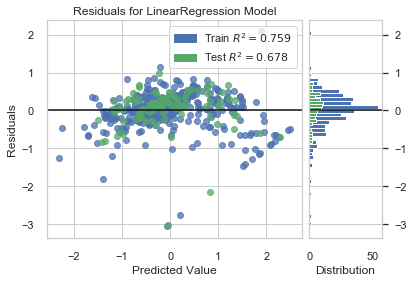

In [19]:
visualizer=ResidualsPlot(linear_reg)
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.poof() 

### Linear Regression Model
Model 1.2: using noise columns and using all features

In [20]:
del X, X_train, X_test, y, y_train , y_test, y_pred, y_pred_train

In [21]:
### Select Features
X=df_boston.drop("MEDV",axis=1).values
features=df_boston.drop("MEDV",axis=1).columns
### select targer
y=df_boston["MEDV"].values

In [22]:
### Scale X
X=preprocessing.scale(X)
y=preprocessing.scale(y)
### SPllit the data
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [23]:
### chose model
linear_reg=linear_model.LinearRegression()
### fit the model
linear_reg.fit(X_train,y_train)
### predict
y_pred=linear_reg.predict(X_test)
y_pred_train=linear_reg.predict(X_train)

In [24]:
### R^2 of train and test
r_square=[metrics.explained_variance_score(y_train,y_pred_train),metrics.explained_variance_score(y_test,y_pred)]
### MAE
MAE=[metrics.mean_absolute_error(y_train,y_pred_train),metrics.mean_absolute_error(y_test,y_pred)]
### MSE
MSE=[metrics.mean_squared_error(y_train,y_pred_train),metrics.mean_squared_error(y_test,y_pred)]
## RMSE
RMSE=[np.sqrt(metrics.mean_squared_error(y_train,y_pred_train)),np.sqrt(metrics.mean_squared_error(y_test,y_pred))]

In [25]:
## Measure Accuracy Molde 1.1
df_lr_acc2=pd.DataFrame({
    "Index":["Train","Test"],
"R^2 With Noise":r_square,"MAE With Noise":MAE,"MSE With Noise":MSE,
"RMSE With Noise": RMSE})
df_lr_acc2

,Index,R^2 With Noise,MAE With Noise,MSE With Noise,RMSE With Noise
0,Train,0.759486,0.349257,0.246408,0.496395
1,Test,0.679171,0.350475,0.288309,0.536945


In [26]:
pd.DataFrame(linear_reg.coef_,features).T

,ATT1,ATT2,ATT3,ATT4,ATT5,ATT6,ATT7,ATT8,ATT9,ATT10,ATT11,ATT12,ATT13,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.072984,-0.010043,0.028621,-0.0004,-0.009597,-0.026766,-0.003809,-0.025626,-0.015178,-0.028279,-0.042908,0.037679,-0.005405,-0.057204,0.094186,0.03861,0.053762,-0.158017,0.410433,-0.074309,-0.335856,0.217899,-0.170501,-0.215033,0.105972,-0.320773


In [27]:
pd.DataFrame({"Intercept":[linear_reg.intercept_]})

,Intercept
0,0.005686


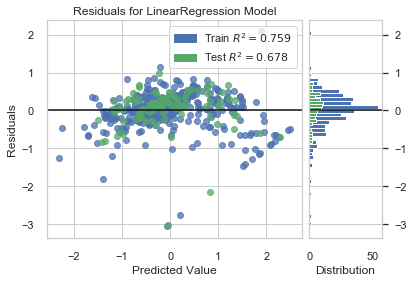

In [28]:
visualizer=ResidualsPlot(linear_reg)
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.poof() 

### Linear Regression Model
Model 1.3: after dropping correlated features

In [29]:
del X, X_train, X_test, y, y_train , y_test, y_pred, y_pred_train

In [30]:
df_corr_matrix=df_boston[cols].drop("MEDV",axis=1).corr().abs()

In [31]:
# Select upper triangle of correlation matrix
upper=df_corr_matrix.where(np.triu(np.ones(df_corr_matrix.shape), k=1).astype(np.bool))
# Find index of feature columns with correlation greater than 0.80
to_drop = [column for column in upper.columns if any(upper[column] > 0.80)]

In [32]:
print("correlated features to drop",to_drop)

correlated features to drop ['RAD', 'TAX']


In [33]:
X=df_boston[cols].drop(df_boston[to_drop], axis=1).drop("MEDV",axis=1).values
y=df_boston["MEDV"].values
features=df_boston[cols].drop(df_boston[to_drop], axis=1).drop("MEDV",axis=1).columns

In [34]:
### Scale X
X=preprocessing.scale(X)
y=preprocessing.scale(y)
### SPllit the data
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [35]:
### chose model
linear_reg=linear_model.LinearRegression()
### fit the model
linear_reg.fit(X_train,y_train)
### predict
y_pred=linear_reg.predict(X_test)
y_pred_train=linear_reg.predict(X_train)

In [36]:
### R^2 of train and test
r_square=[metrics.explained_variance_score(y_train,y_pred_train),metrics.explained_variance_score(y_test,y_pred)]
### MAE
MAE=[metrics.mean_absolute_error(y_train,y_pred_train),metrics.mean_absolute_error(y_test,y_pred)]
### MSE
MSE=[metrics.mean_squared_error(y_train,y_pred_train),metrics.mean_squared_error(y_test,y_pred)]
## RMSE
RMSE=[np.sqrt(metrics.mean_squared_error(y_train,y_pred_train)),np.sqrt(metrics.mean_squared_error(y_test,y_pred))]

In [37]:
pd.DataFrame(linear_reg.coef_,features).T

,ATT1,ATT2,ATT3,ATT4,ATT5,ATT6,ATT7,ATT8,ATT9,ATT10,ATT11,ATT12,ATT13,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,PTRATIO,B,LSTAT
0,0.074426,-0.011666,0.025505,-0.007126,-0.012715,-0.02099,0.003559,-0.028578,-0.015624,-0.025547,-0.042261,0.036324,-0.005967,0.035454,0.062873,-0.011547,0.062978,-0.164308,0.41863,-0.080978,-0.335488,-0.209757,0.112993,-0.331076


In [38]:
pd.DataFrame({"Intercept":[linear_reg.intercept_]})

,Intercept
0,0.004984


In [39]:
## Measure Accuracy Molde 1.1
df_lr_acc3=pd.DataFrame({
    "Index":["Train","Test"],
"R^2 Exluding Correlated Features":r_square,"MAE Exluding Correlated Features":MAE,"MSE Exluding Correlated Features":MSE,
"RMSE Exluding Correlated Features": RMSE})
df_lr_acc3

,Index,R^2 Exluding Correlated Features,MAE Exluding Correlated Features,MSE Exluding Correlated Features,RMSE Exluding Correlated Features
0,Train,0.753592,0.354589,0.252446,0.502440
1,Test,0.661142,0.366876,0.304281,0.551617


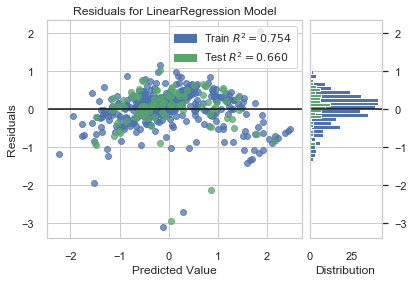

In [40]:
visualizer=ResidualsPlot(linear_reg)
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.poof() 

### All 3 Linear Regression Models

In [41]:
df_lr_acc=pd.merge(pd.merge(df_lr_acc1,df_lr_acc2),df_lr_acc3)
df_lr_acc

,Index,R^2 Main Features,MAE Main Features,MSE Main Features,RMSE Main Features,R^2 With Noise,MAE With Noise,MSE With Noise,RMSE With Noise,R^2 Exluding Correlated Features,MAE Exluding Correlated Features,MSE Exluding Correlated Features,RMSE Exluding Correlated Features
0,Train,0.759486,0.349257,0.246408,0.496395,0.759486,0.349257,0.246408,0.496395,0.753592,0.354589,0.252446,0.502440
1,Test,0.679171,0.350475,0.288309,0.536945,0.679171,0.350475,0.288309,0.536945,0.661142,0.366876,0.304281,0.551617


### Ridge Regression Model
Model 2:

In [42]:
del X, X_train, X_test, y, y_train , y_test, y_pred, y_pred_train

In [43]:
X=df_boston.drop("MEDV",axis=1).values
features=df_boston.drop("MEDV",axis=1).columns
y=df_boston["MEDV"].values
### Scale X
X=preprocessing.scale(X)
y=preprocessing.scale(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [44]:
#Linear_Ridge= linear_model.Ridge(normalize=True)

In [45]:
List_of_alpha=[]
List_of_r_square=[]
List_of_MAE=[]
List_of_MSE=[]
List_of_RMSE=[]
for i in np.arange(.01,1,.001):
    Linear_Ridge= linear_model.Ridge(alpha=i,normalize=True)
    Linear_Ridge.fit(X_train, y_train)
    y_pred=Linear_Ridge.predict(X_test)
    y_pred_train=Linear_Ridge.predict(X_train)
    ### R^2 of train and test
    r_square=[metrics.explained_variance_score(y_train,y_pred_train),metrics.explained_variance_score(y_test,y_pred)]
    ### MAE
    MAE=[metrics.mean_absolute_error(y_train,y_pred_train),metrics.mean_absolute_error(y_test,y_pred)]
    ### MSE
    MSE=[metrics.mean_squared_error(y_train,y_pred_train),metrics.mean_squared_error(y_test,y_pred)]
    ## RMSE
    RMSE=[np.sqrt(metrics.mean_squared_error(y_train,y_pred_train)),np.sqrt(metrics.mean_squared_error(y_test,y_pred))]
    ### Pile up the meterics
    List_of_r_square.append(r_square)
    List_of_MAE.append(MAE)
    List_of_MSE.append(MSE)
    List_of_RMSE.append(RMSE)
    List_of_alpha.append(i)

In [46]:
df_Ridge_models_metrics=pd.merge(pd.merge(pd.merge(pd.DataFrame(List_of_r_square,List_of_alpha,columns=["R^2 Train","R^2 Test"]).reset_index(),
         pd.DataFrame(List_of_MAE,List_of_alpha,columns=["MAE Train","MAE Test"]).reset_index()),
         pd.DataFrame(List_of_MSE,List_of_alpha,columns=["MSE Train","MSE Test"]).reset_index()),
                  pd.DataFrame(List_of_RMSE,List_of_alpha,columns=["RMSE Train","RMSE Test"]).reset_index()).rename(
columns={"index":"Alpha"})

In [47]:
df_Ridge_models_metrics.sort_values("R^2 Test",ascending=False).head()

,Alpha,R^2 Train,R^2 Test,MAE Train,MAE Test,MSE Train,MSE Test,RMSE Train,RMSE Test
45,0.055,0.756801,0.681149,0.347328,0.345399,0.249159,0.286398,0.499158,0.535162
44,0.054,0.756874,0.681149,0.347329,0.345471,0.249083,0.286400,0.499082,0.535163
46,0.056,0.756726,0.681148,0.347327,0.345327,0.249235,0.286398,0.499235,0.535162
43,0.053,0.756948,0.681147,0.347331,0.345543,0.249008,0.286402,0.499007,0.535165
47,0.057,0.756651,0.681147,0.347328,0.345255,0.249312,0.286399,0.499311,0.535162


In [48]:
### Select alpha of the most accurate model
optimal_alpha=df_Ridge_models_metrics.sort_values("R^2 Test",ascending=False).reset_index(drop=True)["Alpha"][0]
optimal_alpha

0.054999999999999966

In [49]:
### Fit the model with the most accurate alpha 
Linear_Ridge= linear_model.Ridge(alpha=optimal_alpha,normalize=True)
Linear_Ridge.fit(X_train,y_train)

Ridge(alpha=0.054999999999999966, copy_X=True, fit_intercept=True,
      max_iter=None, normalize=True, random_state=None, solver='auto',
      tol=0.001)

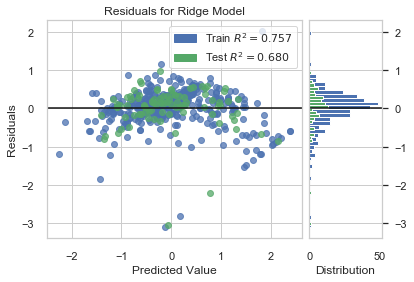

In [50]:
visualizer = ResidualsPlot(Linear_Ridge)
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.poof()    

### Ridge Model Coefficient

In [51]:
pd.DataFrame(Linear_Ridge.coef_,features).T

,ATT1,ATT2,ATT3,ATT4,ATT5,ATT6,ATT7,ATT8,ATT9,ATT10,ATT11,ATT12,ATT13,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.066636,-0.014138,0.026036,-0.005336,-0.010345,-0.023869,0.000309,-0.024035,-0.013697,-0.026117,-0.03982,0.035529,-0.006027,-0.0249,0.070602,0.003585,0.058383,-0.118386,0.39991,-0.062688,-0.279184,0.129302,-0.110105,-0.202222,0.104496,-0.317256


In [52]:
pd.DataFrame({"Intercept":[Linear_Ridge.intercept_]})

,Intercept
0,0.005168


### LASSO Regression Model
Model 3:

In [53]:
del X, X_train, X_test, y, y_train , y_test, y_pred, y_pred_train

In [54]:
X=df_boston.drop("MEDV",axis=1).values
features=df_boston.drop("MEDV",axis=1).columns
y=df_boston["MEDV"].values
### Scale X
X=preprocessing.scale(X)
y=preprocessing.scale(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [55]:
List_of_alpha=[]
List_of_r_square=[]
List_of_MAE=[]
List_of_MSE=[]
List_of_RMSE=[]
for i in np.arange(.01,1,.001):
    Linear_Lasso= linear_model.Lasso(alpha=i,normalize=True)
    Linear_Lasso.fit(X_train, y_train)
    y_pred=Linear_Lasso.predict(X_test)
    y_pred_train=Linear_Lasso.predict(X_train)
    ### R^2 of train and test
    r_square=[metrics.explained_variance_score(y_train,y_pred_train),metrics.explained_variance_score(y_test,y_pred)]
    ### MAE
    MAE=[metrics.mean_absolute_error(y_train,y_pred_train),metrics.mean_absolute_error(y_test,y_pred)]
    ### MSE
    MSE=[metrics.mean_squared_error(y_train,y_pred_train),metrics.mean_squared_error(y_test,y_pred)]
    ## RMSE
    RMSE=[np.sqrt(metrics.mean_squared_error(y_train,y_pred_train)),np.sqrt(metrics.mean_squared_error(y_test,y_pred))]
    ### Pile up the meterics
    List_of_r_square.append(r_square)
    List_of_MAE.append(MAE)
    List_of_MSE.append(MSE)
    List_of_RMSE.append(RMSE)
    List_of_alpha.append(i)

In [56]:
df_Lasso_models_metrics=pd.merge(pd.merge(pd.merge(pd.DataFrame(List_of_r_square,List_of_alpha,columns=["R^2 Train","R^2 Test"]).reset_index(),
         pd.DataFrame(List_of_MAE,List_of_alpha,columns=["MAE Train","MAE Test"]).reset_index()),
         pd.DataFrame(List_of_MSE,List_of_alpha,columns=["MSE Train","MSE Test"]).reset_index()),
                  pd.DataFrame(List_of_RMSE,List_of_alpha,columns=["RMSE Train","RMSE Test"]).reset_index()).rename(
columns={"index":"Alpha"})

In [57]:
df_Lasso_models_metrics=df_Lasso_models_metrics.sort_values("R^2 Test",ascending=False).reset_index(drop=True)
df_Lasso_models_metrics.head()

,Alpha,R^2 Train,R^2 Test,MAE Train,MAE Test,MSE Train,MSE Test,RMSE Train,RMSE Test
0,0.010,0.636420,0.584853,0.425018,0.400913,0.372490,0.376122,0.610320,0.613288
1,0.011,0.623961,0.572952,0.433929,0.411600,0.385254,0.387100,0.620688,0.622174
2,0.012,0.610319,0.559944,0.443034,0.422285,0.399230,0.399081,0.631846,0.631729
3,0.013,0.595487,0.545826,0.452608,0.433113,0.414425,0.412069,0.643759,0.641926
4,0.014,0.579469,0.530601,0.462544,0.444143,0.430836,0.426061,0.656381,0.652734


In [58]:
### Select alpha of the most accurate model
optimal_alpha=df_Lasso_models_metrics.sort_values("R^2 Test",ascending=False)["Alpha"][0]
optimal_alpha

0.01

In [59]:
### Fit the model with the most accurate alpha 
Linear_Lasso= linear_model.Lasso(alpha=optimal_alpha,normalize=True)
Linear_Lasso.fit(X_train,y_train)

Lasso(alpha=0.01, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=True, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

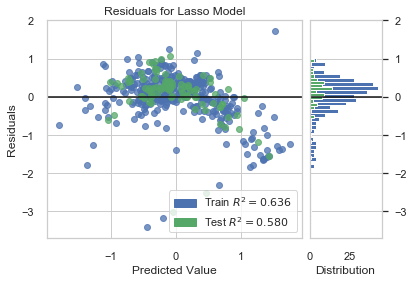

In [60]:
visualizer = ResidualsPlot(Linear_Lasso)
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.poof()

### Lasso Model Coefficient

In [61]:
pd.DataFrame(Linear_Lasso.coef_,features).T

,ATT1,ATT2,ATT3,ATT4,ATT5,ATT6,ATT7,ATT8,ATT9,ATT10,ATT11,ATT12,ATT13,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,-0.0,0.35929,-0.0,-0.0,-0.0,-0.0,-0.081616,0.0,-0.26447


In [62]:
pd.DataFrame({"Intercept":[Linear_Lasso.intercept_]})

,Intercept
0,0.012869


### Conclusions

In [63]:
print("It seems Lasso Model is reconginzing the noise better and shrinking the model and mainly adequating \
to RM PTRATIO and LSTAT features and setting the coefficent of everything else almost to Zero while Ridge model \
is using most of the features while assigning small coefficient to the noise and putting more weight on actual features. \
I don't understand it why the linear regrssion model with noise is not mouch different than linear regrssion without noise.\
without noise.")

It seems Lasso Model is reconginzing the noise better and shrinking the model and mainly adequating to RM PTRATIO and LSTAT features and setting the coefficent of everything else almost to Zero while Ridge model is using most of the features while assigning small coefficient to the noise and putting more weight on actual features. I don't understand it why the linear regrssion model with noise is not mouch different than linear regrssion without noise.without noise.


In [64]:
print("My name is Farbod Baharkoush")
print("My NetID is: fbahar2")
print("I hereby certify that I have read the University policy on Academic Integrity and that I am not in violation.")

My name is Farbod Baharkoush
My NetID is: fbahar2
I hereby certify that I have read the University policy on Academic Integrity and that I am not in violation.
